In [26]:
import sys
import pandas as pd
from matplotlib import pyplot as plt
from scipy import stats
from sklearn.model_selection import train_test_split

sys.path.insert(1, '../rule_lib')
sys.path.insert(1, '../../../notes/1-Testing/fuzzy-test/python/')

from rule_extraction import *

%load_ext autoreload
%autoreload 2
%matplotlib widget

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Load Data from Folders


In [27]:
dataPairs = []

directories = []
for root, dirs, files in os.walk("../../tuning-results-pause-during-examples/data-wsl2/"):
    for name in dirs:
        directories.append(os.path.join(root, name))


for directory in directories:

    files = os.listdir(directory)
    for file in files:
        if "liveInfoLogger" in file:
            liveInfo = pd.read_csv(directory + "/" + file)
            liveInfo = liveInfo.dropna()
        if "tuningData" in file:
            tuningData = pd.read_csv(directory + "/" + file)
            tuningData = tuningData.dropna()
        if "tuningResults" in file:
            tuningResults = pd.read_csv(directory + "/" + file)
            tuningResults = tuningResults.dropna()

    # filter rows where NaN is present

    tuning_iterations = tuningData["Iteration"]

    corresponding_liveInfo = liveInfo.loc[liveInfo["Iteration"].isin(
        tuning_iterations)]

    assert len(corresponding_liveInfo) == len(
        tuningData), "Length of liveInfo and tuningData does not match"

    # strip columns
    corresponding_liveInfo.columns = corresponding_liveInfo.columns.str.strip()
    tuningData.columns = tuningData.columns.str.strip()

    # convert tuningData timings into percentages
    maxTime = tuningData["Reduced"].max()
    tuningData.insert(1, "PerformancePercentage", (
        tuningData["Reduced"] / maxTime) * 100)

    # merge container and Data Layout
    tuningData["Container_DataLayout"] = tuningData["Container"] + \
        "_" + tuningData["Data Layout"]

    tuningData.drop(columns=["Container", "Data Layout"], inplace=True)

    dataPairs.append((corresponding_liveInfo, tuningData))

In [28]:
df = pd.DataFrame()

for batch, (X, y) in enumerate(dataPairs):
    merged = pd.merge(X, y, on="Iteration")
    df = pd.concat([df, merged])

df = df.drop(columns=["Iteration", "Date_x", "Date_y"])
df = df.drop(list(df.filter(regex='sample')), axis=1)
df.shape

(28995, 29)

In [29]:
df.describe()

,avgParticlesPerCell,cutoff,domainSizeX,domainSizeY,domainSizeZ,estimatedNumNeighborInteractions,homogeneity,maxDensity,maxParticlesPerCell,minParticlesPerCell,...,particleSizeNeededByFunctor,particlesPerBlurredCellStdDev,particlesPerCellStdDev,rebuildFrequency,skin,threadCount,PerformancePercentage,CellSizeFactor,Reduced,Smoothed
count,28995.000000,28995.000000,28995.000000,28995.000000,28995.000000,2.899500e+04,28995.000000,28995.000000,28995.000000,28995.0,...,28995.0,28995.000000,28995.000000,28995.000000,28995.000000,28995.0,28995.000000,28995.0,2.899500e+04,2.899500e+04
mean,1.054852,2.915796,61.454026,62.160700,60.516804,1.307551e+05,0.085897,0.525502,20.194447,0.0,...,72.0,0.328594,0.045470,10.281945,1.064287,12.0,17.614313,1.0,5.152688e+07,4.810560e+07
std,1.590543,0.231970,24.336494,23.533981,25.100458,1.921074e+05,0.103670,0.331931,7.418830,0.0,...,0.0,0.255194,0.060040,1.153377,0.504678,0.0,12.772694,0.0,1.008837e+08,8.905544e+07
min,0.068390,2.000000,15.000000,29.561231,15.000000,3.285000e+03,0.003197,0.016158,3.000000,0.0,...,72.0,0.024498,0.011771,10.000000,0.200000,12.0,1.244363,1.0,6.842310e+05,6.842310e+05
25%,0.305312,3.000000,50.000000,50.000000,50.000000,3.356400e+04,0.027972,0.212400,16.000000,0.0,...,72.0,0.215287,0.017843,10.000000,1.000000,12.0,9.047065,1.0,1.546685e+07,1.485115e+07
50%,0.547120,3.000000,50.000000,50.000000,50.000000,8.085200e+04,0.044302,0.520800,22.000000,0.0,...,72.0,0.299439,0.040432,10.000000,1.000000,12.0,13.986347,1.0,2.562822e+07,2.468236e+07
75%,0.944637,3.000000,100.000000,100.000000,100.000000,9.396900e+04,0.082399,0.688200,24.000000,0.0,...,72.0,0.349292,0.045114,10.000000,1.000000,12.0,22.417374,1.0,4.520086e+07,4.347496e+07
max,7.061688,3.000000,100.000000,100.000000,100.000000,1.032785e+06,0.547827,1.879647,51.000000,0.0,...,72.0,2.008868,0.478737,15.000000,3.000000,12.0,100.000000,1.0,2.168150e+09,1.934718e+09


In [30]:
df.columns

Index(['avgParticlesPerCell', 'cutoff', 'domainSizeX', 'domainSizeY',
       'domainSizeZ', 'estimatedNumNeighborInteractions', 'homogeneity',
       'maxDensity', 'maxParticlesPerCell', 'minParticlesPerCell', 'numCells',
       'numEmptyCells', 'numHaloParticles', 'numParticles', 'particleSize',
       'particleSizeNeededByFunctor', 'particlesPerBlurredCellStdDev',
       'particlesPerCellStdDev', 'rebuildFrequency', 'skin', 'threadCount',
       'PerformancePercentage', 'CellSizeFactor', 'Traversal',
       'Load Estimator', 'Newton 3', 'Reduced', 'Smoothed',
       'Container_DataLayout'],
      dtype='object')

# Define Interesting Data to observe


In [31]:
inputs = [
    "avgParticlesPerCell",
    # "cutoff",
    # "domainSizeX",
    # "domainSizeY",
    # "domainSizeZ",
    # "estimatedNumNeighborInteractions",
    'homogeneity',
    'maxDensity',
    "maxParticlesPerCell",
    # "minParticlesPerCell",
    # "numCells",
    # "numEmptyCells",
    # "numHaloParticles",
    # "numParticles",
    # "particleSize",
    # "particleSizeNeededByFunctor",
    # "particlesPerBlurredCellStdDev",
    "particlesPerCellStdDev",
    # "rebuildFrequency",
    # "skin",
    # "threadCount",
]

outputs = [
    "Container_DataLayout",
    # "CellSizeFactor",
    "Traversal",
    # "Load Estimator",
    "Newton 3",
]

In [32]:
df.columns

Index(['avgParticlesPerCell', 'cutoff', 'domainSizeX', 'domainSizeY',
       'domainSizeZ', 'estimatedNumNeighborInteractions', 'homogeneity',
       'maxDensity', 'maxParticlesPerCell', 'minParticlesPerCell', 'numCells',
       'numEmptyCells', 'numHaloParticles', 'numParticles', 'particleSize',
       'particleSizeNeededByFunctor', 'particlesPerBlurredCellStdDev',
       'particlesPerCellStdDev', 'rebuildFrequency', 'skin', 'threadCount',
       'PerformancePercentage', 'CellSizeFactor', 'Traversal',
       'Load Estimator', 'Newton 3', 'Reduced', 'Smoothed',
       'Container_DataLayout'],
      dtype='object')

# Filter Data / Outliers


In [33]:
# only keep rows where performance percentage is above x
dffiltered = df[df["PerformancePercentage"] >= 70]


def combine_columns(row):
    return ", ".join(sorted(map(str, list(np.unique(row)))))


# group data on input columns and concatenate output columns
dfgrouped = dffiltered.groupby(inputs).agg(combine_columns).reset_index()

# remove columns that are not needed
dfgrouped.drop(columns=["Reduced", "Smoothed",
               "PerformancePercentage"], inplace=True)

X, y = dfgrouped[inputs], dfgrouped[outputs]

print(X.shape, y.shape)

(100, 5) (100, 3)


# Create Train and Test Data


In [34]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42)

# save to csv
pd.concat([X_train, y_train], axis=1).to_pickle("train.pkl")
pd.concat([X_test, y_test], axis=1).to_pickle("test.pkl")

# Final Data


In [35]:
pd.concat([X_train, y_train], axis=1).head()

,avgParticlesPerCell,homogeneity,maxDensity,maxParticlesPerCell,particlesPerCellStdDev,Container_DataLayout,Traversal,Newton 3
55,0.944637,0.082461,0.684480,23.0,0.040583,"LinkedCells_AoS, VerletClusterLists_AoS","lc_c04, vcl_c06",disabled
88,2.305438,0.086579,0.573123,11.0,0.013639,"PairwiseVerletLists_SoA, VerletClusterLists_AoS","vcl_sliced, vcl_sliced_c02, vlp_c08, vlp_c18, ...",disabled
26,0.944637,0.081545,0.688200,23.0,0.039974,"LinkedCells_AoS, VerletClusterLists_AoS","lc_c04, vcl_c06",disabled
42,0.944637,0.082044,0.706800,24.0,0.040130,"LinkedCells_AoS, VerletClusterLists_AoS","lc_c04, vcl_c06",disabled
69,0.944637,0.082888,0.662160,21.0,0.040563,"LinkedCells_AoS, VerletClusterLists_AoS","lc_c04, vcl_c06",disabled


In [36]:
for i, col in enumerate(y.columns):

    y_count = y[col].value_counts()

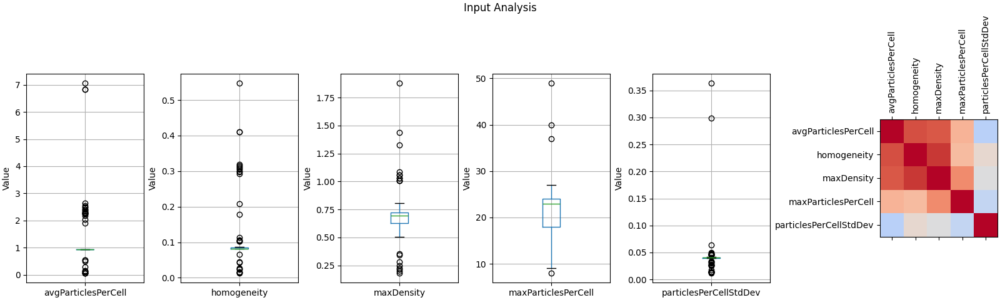

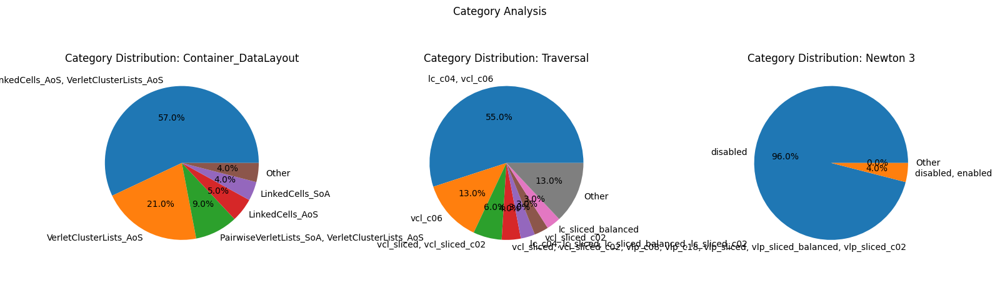

In [37]:
import seaborn as sns

# Row 1
fig, ax1 = plt.subplots(1, len(X.columns)+1, constrained_layout=True)

fig.suptitle("Input Analysis")
fig.set_figwidth(16)

for i, col in enumerate(X.columns):
    X[[col]].boxplot(ax=ax1[i], showfliers=True)
    ax1[i].set_ylabel("Value")

i += 1
# Correlation Matrix
corr = X.corr()
cax = ax1[i].matshow(corr, cmap='coolwarm', vmin=-1, vmax=1)
ax1[i].set_xticks(range(len(X.columns)))
ax1[i].set_yticks(range(len(X.columns)))
ax1[i].set_xticklabels(X.columns, rotation=90)
ax1[i].set_yticklabels(X.columns)


# Row 2
fig, ax1 = plt.subplots(1, len(y_train.columns))
fig.suptitle("Category Analysis")
fig.set_figwidth(16)
fig.tight_layout(pad=3.0)


for i, col in enumerate(y.columns):
    y_count = y[col].value_counts()

    total = y_count.sum()

    # grouping categories with less than 2% of the total
    y_count_group = y_count[y_count.gt(total*0.02)]
    y_count_group["Other"] = y_count[~y_count.index.isin(
        y_count_group.index)].sum()

    ax1[i].pie(y_count_group, labels=y_count_group.index, autopct='%1.1f%%')
    ax1[i].set_title(f"Category Distribution: {col}")

# Train Decision Tree and Extract Rules


In [38]:
# number of input parameters that can be used simultaneously
POSSIBLE_NUMBER_OF_COMBINATIONS = [2, 3, 4, 5]

CCP_ALPHA = {
    "Container_DataLayout": 0.03,
    "Traversal": 0.03,
    "Data Layout": 0.03,
    "Newton 3": 0.02,

}

# maximum depth of the decision tree
MAX_DEPTH = 5

# how many trees should be used to create rules for each label
TOP_K_MODELS_PER_LABEL = 3

Training on 80 samples
Number of rules 105:
	Container_DataLayout (32 rules)
	Traversal (64 rules)
	Newton 3 (9 rules)


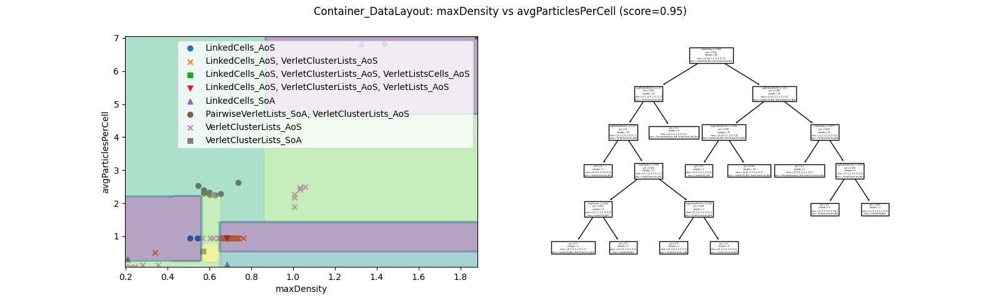

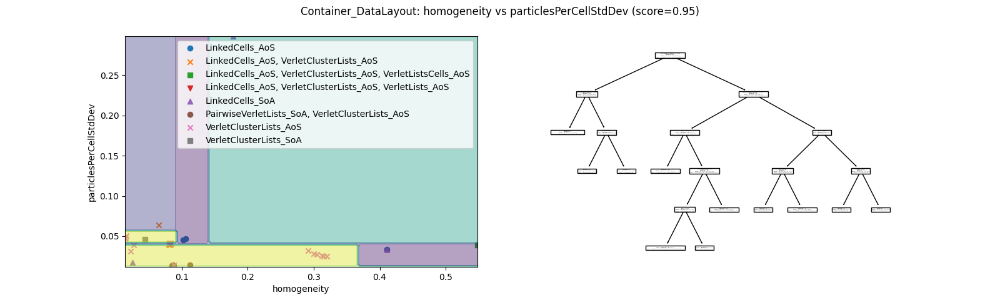

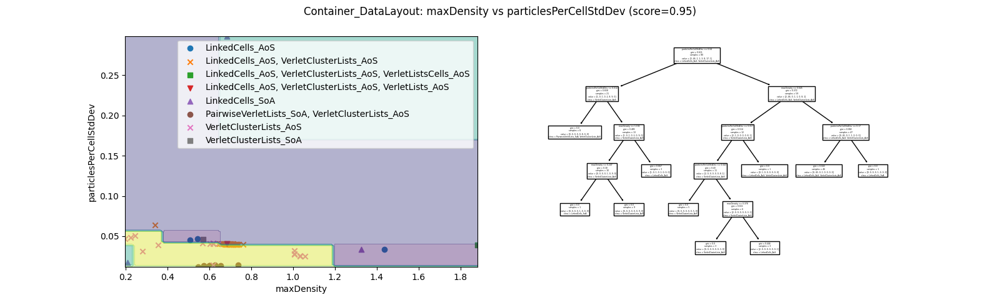

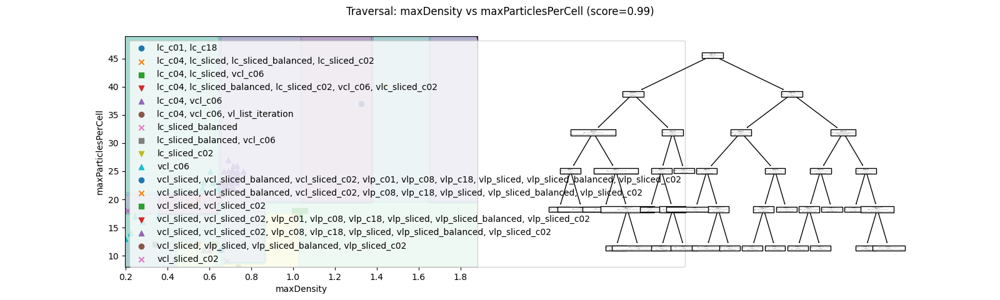

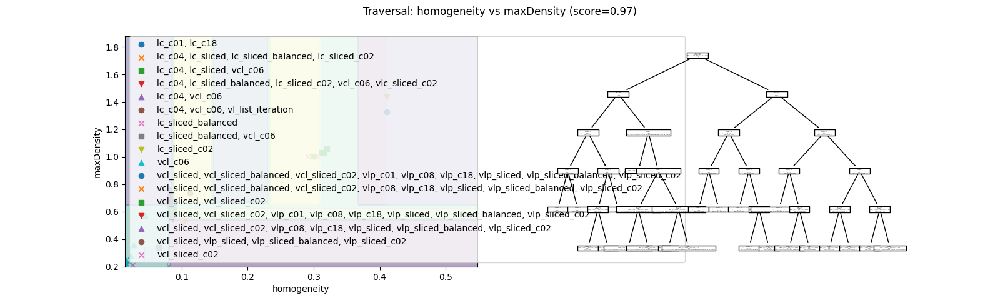

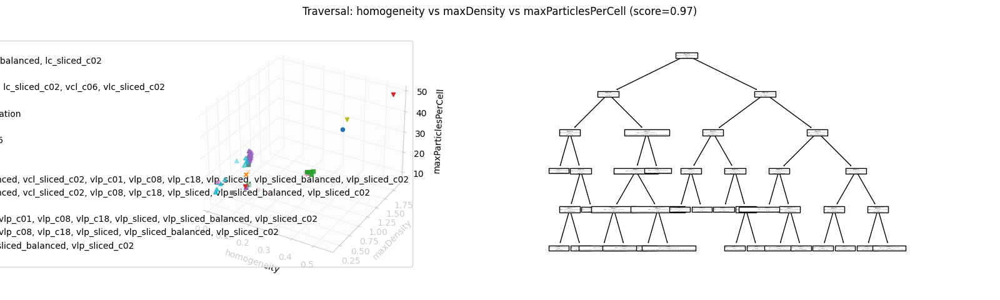

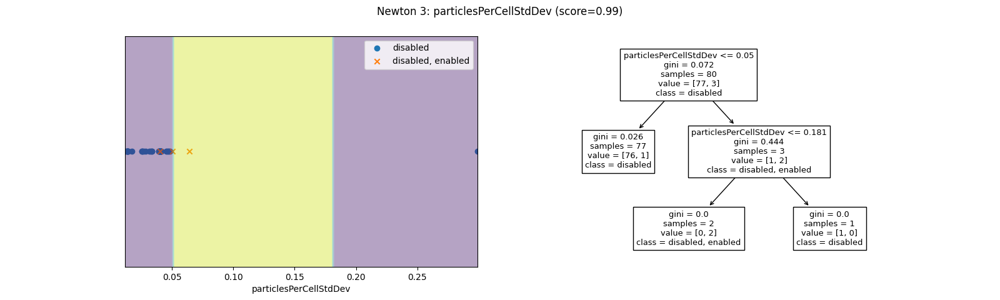

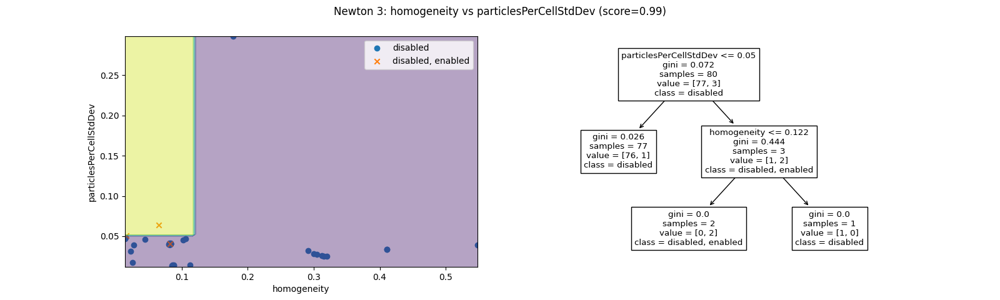

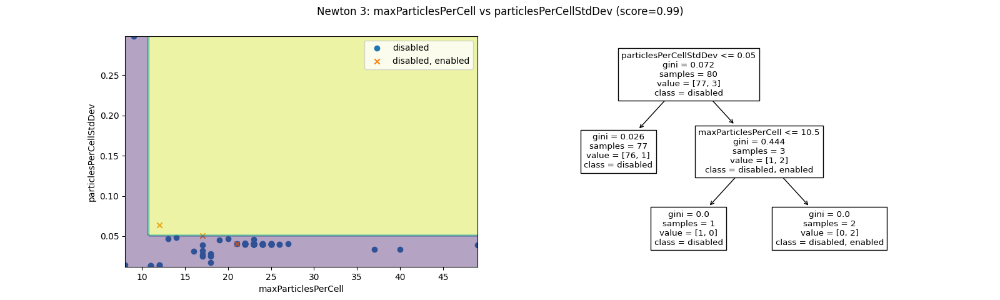

In [39]:
auto_rules = create_auto_rules(X_train, y_train,  None,
                               POSSIBLE_NUMBER_OF_COMBINATIONS, CCP_ALPHA, MAX_DEPTH, TOP_K_MODELS_PER_LABEL)

maxDensity: [-inf, 0.205, 0.218, 0.247, 0.348, 0.36, 0.378, 0.425, 0.443, 0.544, 0.556, 0.559, 0.61, 0.624, 0.645, 0.653, 0.66, 0.669, 0.871, 1.019, 1.044, 1.192, 1.381, 1.658, inf]
maxDensity: [-inf, 0.205, 0.247, 0.348, 0.378, 0.425, 0.443, 0.544, 0.559, 0.61, 0.624, 0.645, 0.66, 0.871, 1.019, 1.044, 1.192, 1.381, 1.658, inf]

avgParticlesPerCell: [-inf, 0.221, 0.546, 0.746, 1.42, 2.25, 4.663, inf]
avgParticlesPerCell: [-inf, 0.221, 0.546, 0.746, 1.42, 2.25, 4.663, inf]

particlesPerCellStdDev: [-inf, 0.014, 0.04, 0.041, 0.043, 0.05, 0.057, 0.17, 0.181, inf]
particlesPerCellStdDev: [-inf, 0.014, 0.04, 0.05, 0.057, 0.17, 0.181, inf]

homogeneity: [-inf, 0.044, 0.083, 0.084, 0.086, 0.092, 0.1, 0.122, 0.142, 0.145, 0.235, 0.308, 0.365, 0.411, inf]
homogeneity: [-inf, 0.044, 0.083, 0.092, 0.1, 0.122, 0.142, 0.235, 0.308, 0.365, 0.411, inf]

maxParticlesPerCell: [-inf, 8.5, 10.5, 12.5, 15.5, 17.5, 19.5, 21.0, 21.5, 22.0, inf]
maxParticlesPerCell: [-inf, 8.5, 10.5, 12.5, 15.5, 17.5, 19.5, 

/home/manuel/AutoPas-FuzzyTuning-Bachelor-Thesis/data/analysis/pause-during-examples/../../../notes/1-Testing/fuzzy-test/python/fuzzy_system.py:335: RuntimeWarning: overflow encountered in exp
  def function(x): return 1 / (1 + np.exp(-width * (x - center)))


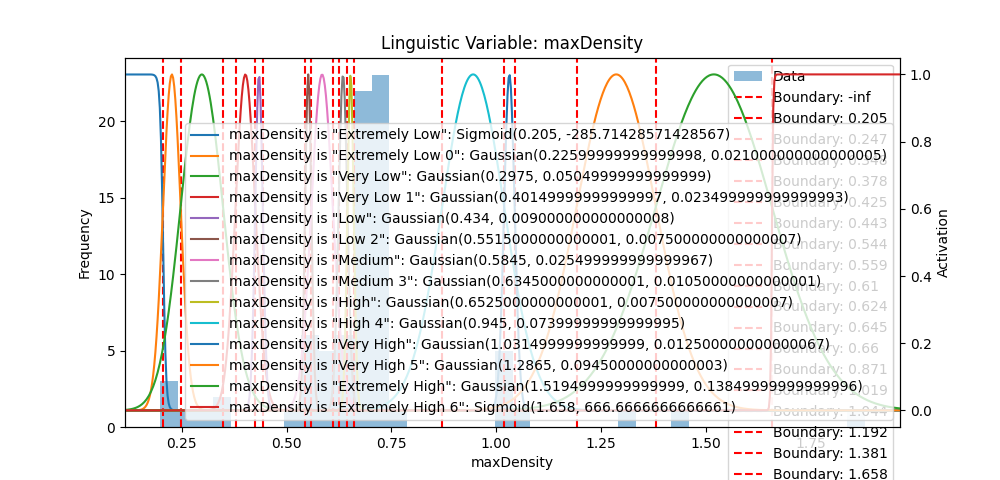

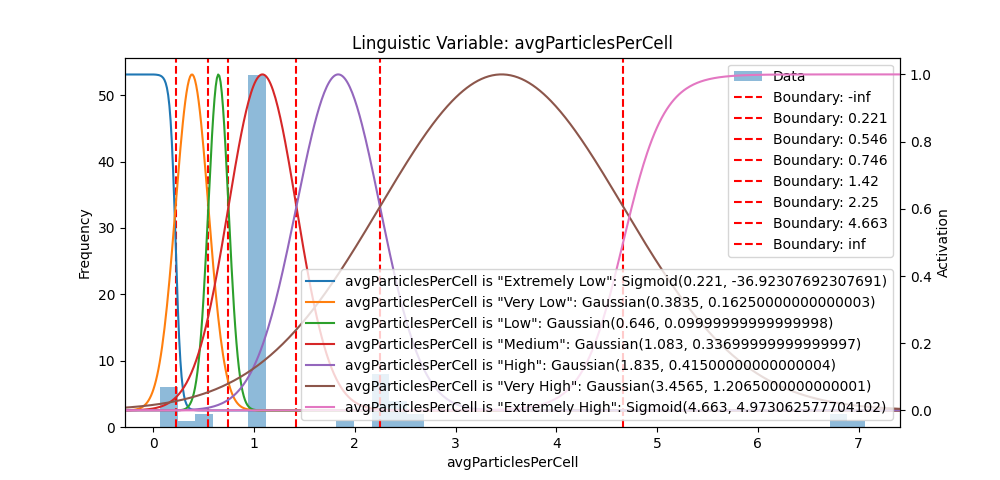

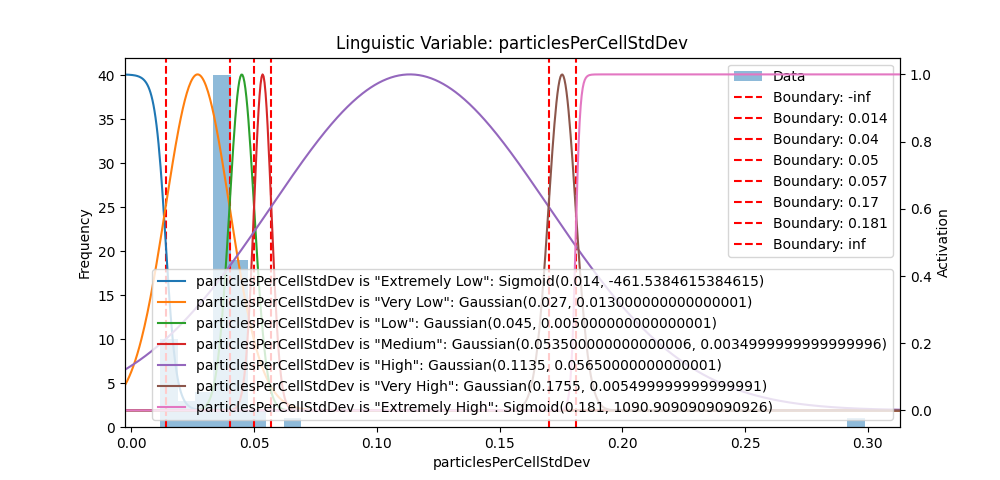

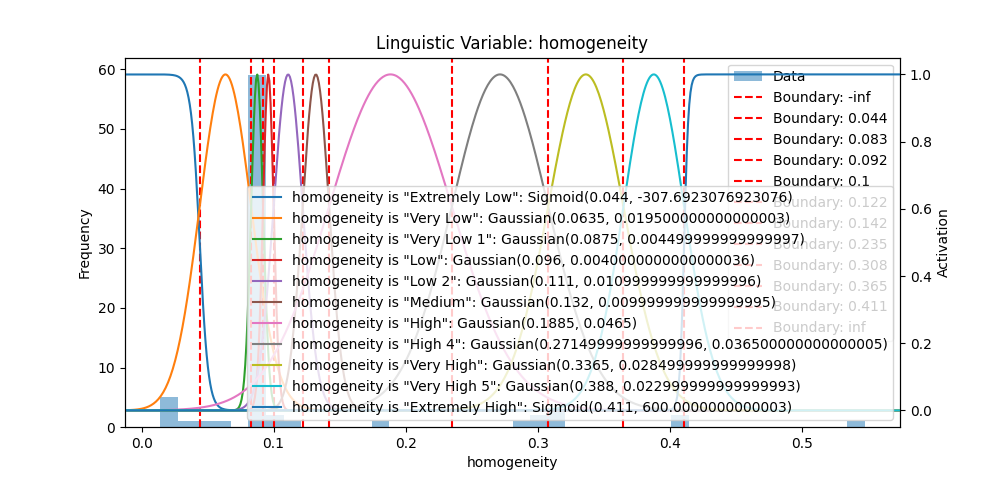

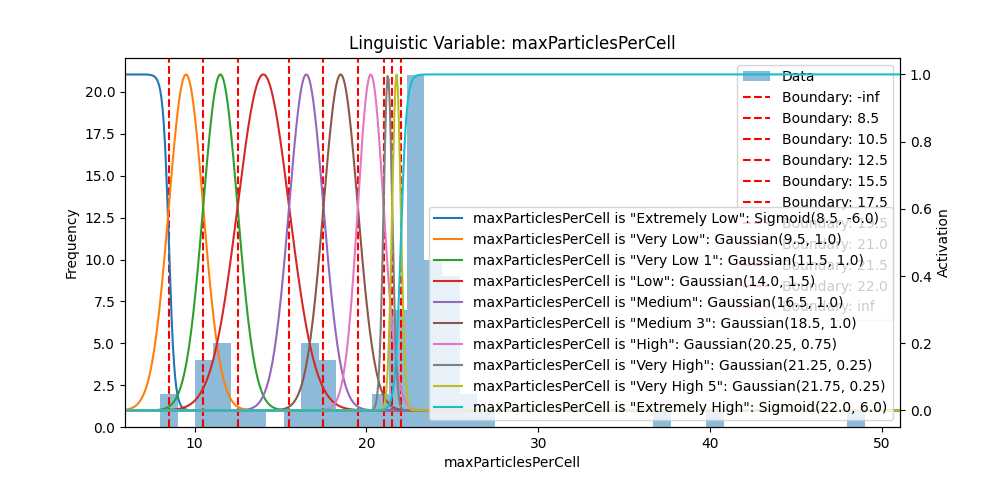

In [40]:
inputs_approach1, rules_approach1 = create_rules_approach1(
    X_train, auto_rules)

# Aproach 2

Follows https://www.sciencedirect.com/science/article/pii/S0165011406002533


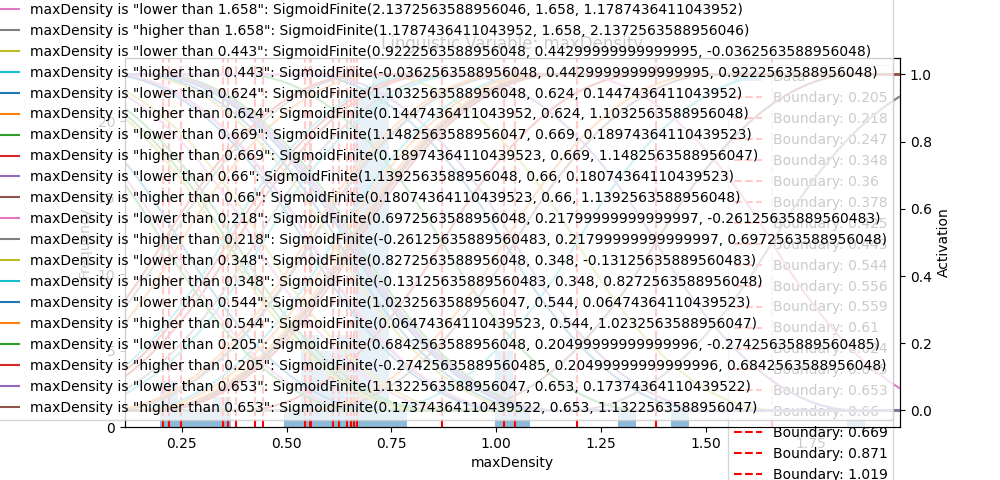

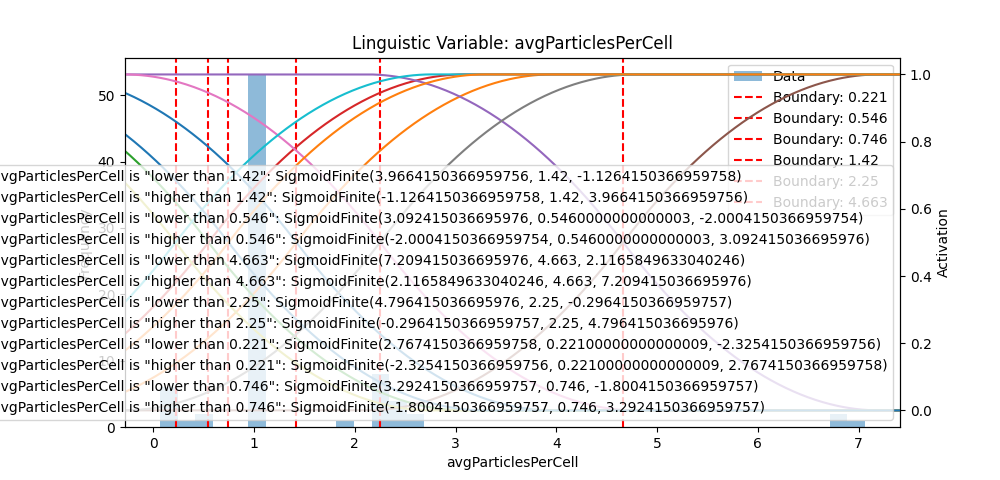

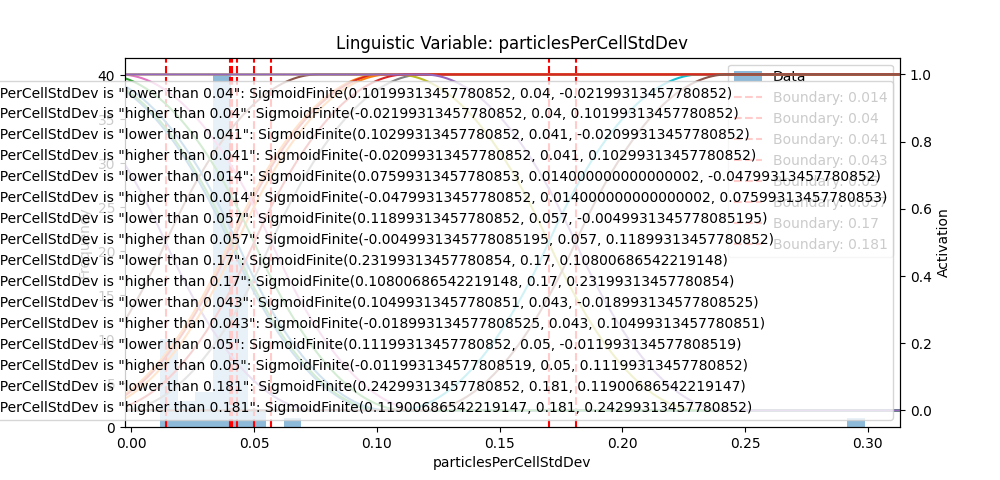

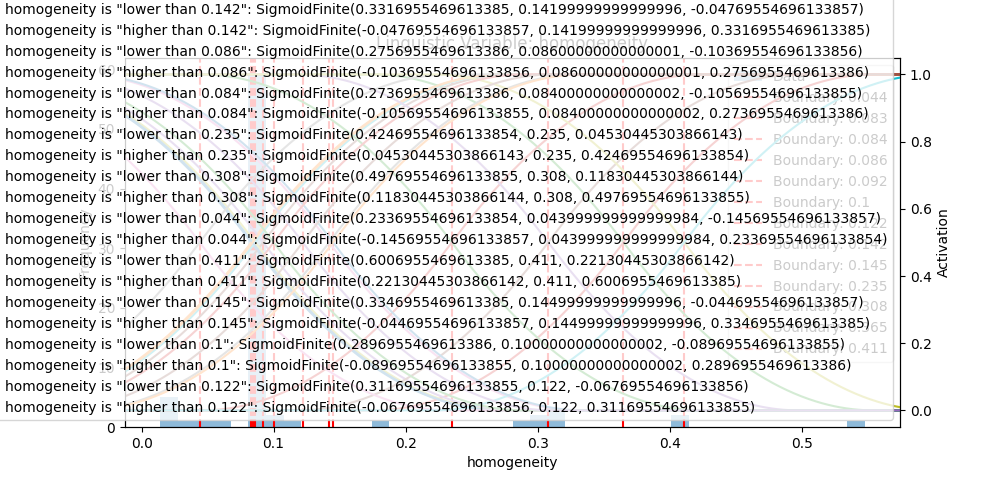

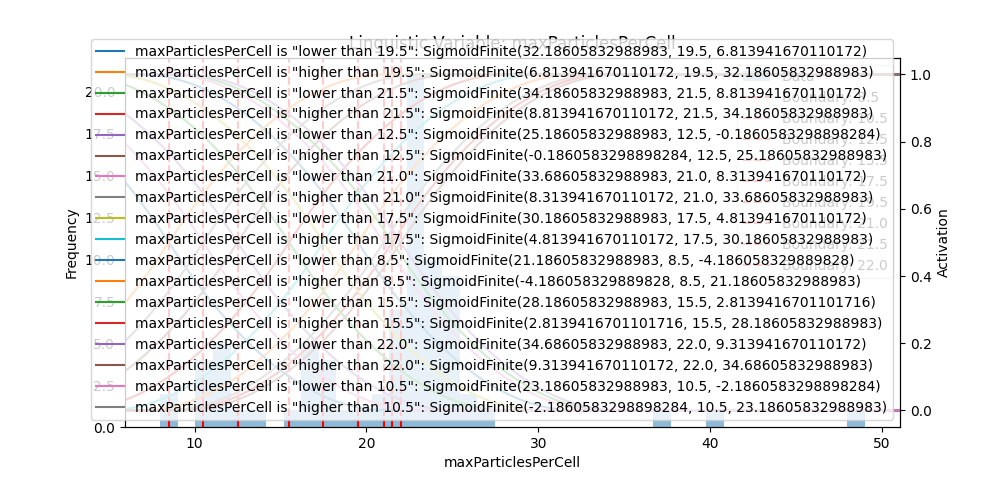

In [41]:
inputs_approach_2, rules_approach2 = create_rules_approach2(
    X_train, auto_rules)

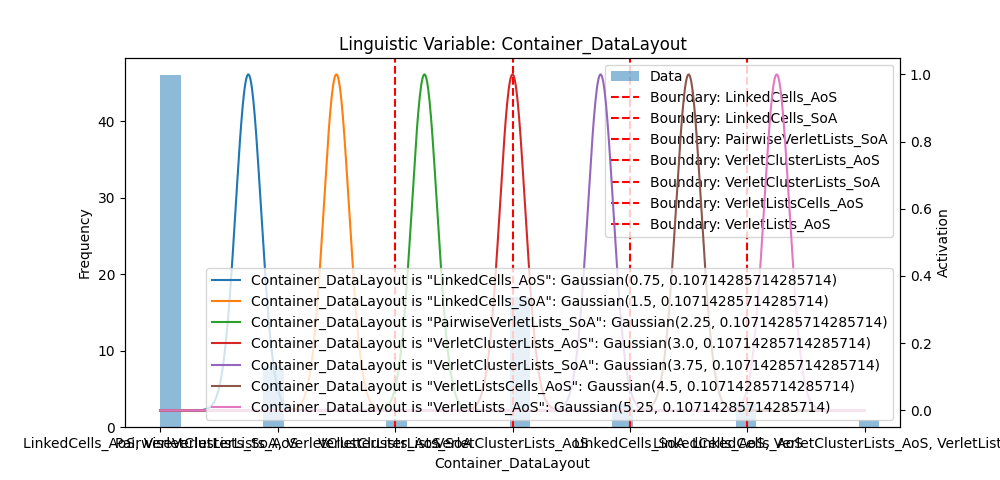

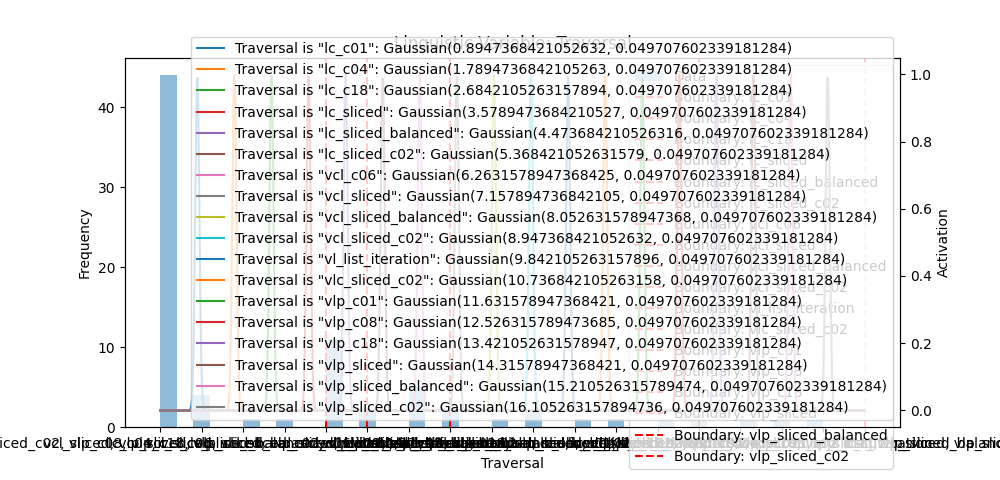

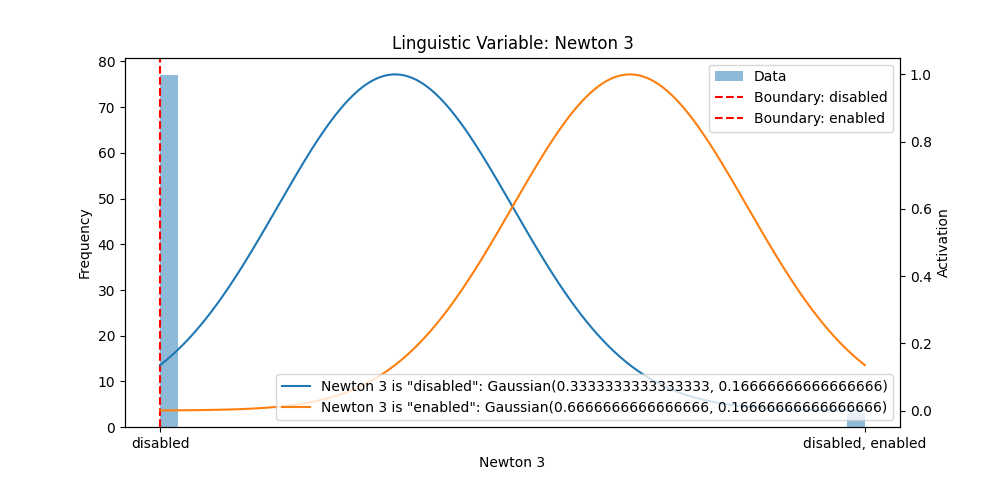

In [42]:
outputRangeMembershipFunctions = create_output_membership_functions(y_train)

# Save all the data


In [48]:
save_linguistic_variables(inputs_approach1, "approach1/fuzzy-inputs.txt")
save_linguistic_variables(outputRangeMembershipFunctions,
                          "approach1/fuzzy-outputs.txt")

save_fuzzy_rules(rules_approach1, "approach1/fuzzy-rules.txt")


save_linguistic_variables(inputs_approach_2, "approach2/fuzzy-inputs.txt")
save_linguistic_variables(outputRangeMembershipFunctions,
                          "approach2/fuzzy-outputs.txt")

save_fuzzy_rules(rules_approach2, "approach2/fuzzy-rules.txt")

FuzzyVariable: domain: "maxDensity" range: (-0.2810033588956048, 2.358903358895605)
	"Extremely Low": Sigmoid(0.205, -285.71428571428567)
	"Extremely Low 0": Gaussian(0.22599999999999998, 0.021000000000000005)
	"Very Low": Gaussian(0.2975, 0.05049999999999999)
	"Very Low 1": Gaussian(0.40149999999999997, 0.023499999999999993)
	"Low": Gaussian(0.434, 0.009000000000000008)
	"Low 2": Gaussian(0.5515000000000001, 0.007500000000000007)
	"Medium": Gaussian(0.5845, 0.025499999999999967)
	"Medium 3": Gaussian(0.6345000000000001, 0.01050000000000001)
	"High": Gaussian(0.6525000000000001, 0.007500000000000007)
	"High 4": Gaussian(0.945, 0.07399999999999995)
	"Very High": Gaussian(1.0314999999999999, 0.012500000000000067)
	"Very High 5": Gaussian(1.2865, 0.09450000000000003)
	"Extremely High": Gaussian(1.5194999999999999, 0.13849999999999996)
	"Extremely High 6": Sigmoid(1.658, 666.6666666666661)

FuzzyVariable: domain: "avgParticlesPerCell" range: (-2.4780250366959757, 9.608103036695976)
	"Extre